# Ordenando un patio de maniobras 

## Descripción

¡Felicidades! Eres el nuevo gerente de una patio de maniobras muy soleada, ideal para la eficiencia energética de tus equipos. Te han asignado cinco robots innovadores para ayudarte a organizar el espacio. El patio está en completo desorden debido al gerente anterior, así que tu tarea es coordinar a los robots para organizar las cajas y hacer que el patio de labores funcione de manera eficiente.

Cada robot tiene ruedas omnidireccionales, lo que les permite moverse en las cuatro direcciones. Además, pueden recoger cajas en celdas adyacentes y transportarlas a cualquier otra ubicación, incluso apilándolas en torres de hasta cinco cajas. Los robots están equipados con sensores avanzados que les permiten detectar lo que hay en las cuatro celdas alrededor de ellos: puede ser una celda vacía, una pared, una pila de cajas (y cuántas cajas contiene) o incluso otro robot. También saben cuándo están llevando una caja gracias a sus sensores de presión.

Cada robot consume una unidad de energía por cada celda que se desplaza. Inicialmente, cada robot dispone de 200 unidades de energía, permitiéndoles moverse una cantidad razonable antes de requerir recarga. Además, los robots están equipados con celdas fotovoltaicas para aprovechar la abundante luz solar en este espacio abierto. Cuando un robot necesita recargarse, debe permanecer inactivo durante 10 pasos de simulación para completar el proceso de recarga.

Tu misión es desarrollar una estrategia para organizar todas las cajas en pilas de exactamente cinco unidades cada una. Debes minimizar la distancia total recorrida por los robots, reducir el tiempo total de recarga y disminuir la cantidad de recargas necesarias para cada robot.

## Requerimientos

- El patio de maniobras tiene un tamaño de 20 x 20 celdas.
- Comienza con 100 cajas distribuidas aleatoriamente en el suelo del patio, sin pilas.
- Los robots empiezan en posiciones vacías y aleatorias.
- La simulación termina cuando todas las cajas están apiladas en columnas de cinco cajas.
- Desarrolla dos soluciones distintas: la primera sin coordinación, basada en movimientos aleatorios de los robots, y la segunda con una estrategia coordinada. La estrategia coordinada debe buscar minimizar la distancia total recorrida por los robots, reducir el tiempo total de recarga y disminuir la cantidad de recargas necesarias para cada robot.
- Debes crear una visualización tanto para la solución sin coordinación como para la solución con la estrategia coordinada.

## Especificaciones de entrega

- Deberás presentar un informe en formato PDF que describa detalladamente los mecanismos de coordinación utilizados, las estructuras de datos y los algoritmos empleados, junto con la justificación para cada elección. Además, utilizando gráficas y datos obtenidos de tus simulaciones, argumenta si la solución coordinada ha conseguido una mejora significativa. Si no es así, indica posibles cambios que podrías implementar para lograr esa mejora. Ten en cuenta que el informe debe tener una extensión mínima de una página y que los resultados basados en menos de 10 simulaciones no se considerarán fiables.

- El cuaderno Jupyter que contiene tu implementación en Python.



# Instalación e importación de librerías

In [1]:
# Descargar mesa y seaborn
%pip install mesa==2.3.1 seaborn --quiet

Note: you may need to restart the kernel to use updated packages.


In [2]:
# Importamos las clases que se requieren para manejar los agentes (Agent) y su entorno (Model).
# Cada modelo puede contener múltiples agentes.
from mesa import Agent, Model

# Debido a que necesitamos que existe un solo agente por celda, elegimos ''SingleGrid''.
from mesa.space import SingleGrid

# Con ''SimultaneousActivation, hacemos que todos los agentes se activen ''al mismo tiempo''.
from mesa.time import SimultaneousActivation

# Haremos uso de ''DataCollector'' para obtener información de cada paso de la simulación.
from mesa.datacollection import DataCollector

# BATCH_RUNNER
from mesa.batchrunner import batch_run

# matplotlib lo usaremos crear una animación de cada uno de los pasos del modelo.
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.animation as animation
plt.rcParams["animation.html"] = "jshtml"
matplotlib.rcParams['animation.embed_limit'] = 2**128

# Importamos los siguientes paquetes para el mejor manejo de valores numéricos.
import numpy as np
import pandas as pd

# Definimos otros paquetes que vamos a usar para medir el tiempo de ejecución de nuestro algoritmo.
import time
import datetime

# Importamos el paquete seaborn para mejorar la visualización de los datos.
import seaborn as sns

# Solución aleatoria.

El enfoque de esta solución consiste en las siguientes reglas.

- Los robots se mueven aleatoriamente y no se comunican entre sí.
- Los robots al iniciar su primera pila, guardan su ubicación y llevan las cajas a dicha pila.
- Para evitar la creación de pilas que queden incompletas, los robots tendrán un límite de pilas que pueden hacer que estará definido por el total de cajas sobre el tamaño de las pilas sobre el número de agentes.


In [3]:
class RobotAgent(Agent):
    """
    Clase que define al agente robot que ordenará los paquetes.
    """

    def __init__(self, id, model, max_energy, max_stacks):
        """
        Inicializa el agente robot.

        Args:
            id: Identificador único del agente.
            model: Modelo en el que se encuentra el agente.
            max_energy: Energía máxima del agente.
            max_stacks: Número máximo de pilas que puede ordenar el agente.
        """

        # Inicializa la clase padre.
        super().__init__(id, model)

        # Inicializa los atributos del agente (False = No está cargando, True = Está cargando).
        self.package = False

        # Inicializa la energía del agente.
        self.energy = max_energy

        # Inicializa el número de pilas que puede ordenar el agente.
        self.max_stacks = max_stacks

        # Inicializa el número de pilas que ha ordenado el agente.
        self.stacks = 0

        # Ubicación de la pila que está ordenando el agente.
        self.stack = None

        # Pasos necesarios para recargar la energía del agente.
        self.steps_to_recharge = 10

        # Recarga de energía.
        self.recharge = 0

        # ¿Cúantos pasos necesita el agente para llenar una pila?
        self.steps_to_fill = 0
        self.steps_to_fill_array = []

    def search_package(self):
        """
        Mueve al agente robot a una celda adyacente para buscar un paquete.
        """

        # Stack para guardar las celdas vacías.
        empty_cells = []

        # Obtiene las celdas adyacentes.
        possible_steps = self.model.grid.get_neighborhood(
            self.pos, 
            moore=False, 
            include_center=False)

        # Obtener indices del arreglo de posiciones posibles y desordenarlos
        indexes = [x for x in range(len(possible_steps))]
        np.random.shuffle(indexes)

        # Bandera para saber si encontró un paquete.
        found = False

        # Busca un paquete en las celdas adyacentes.
        for i in indexes:

            # Obtiene las coordenadas de la celda.
            (x, y) = possible_steps[i]

            # ¿No hay otro agente en la celda?
            if self.model.grid.is_cell_empty((x, y)):

                # ¿Hay un paquete en la celda?
                if self.model.grid[x][y] == 1:

                    # Mueve al agente a la celda.
                    self.model.grid.move_agent(self, (x, y))

                    # Actualiza la energía del agente.
                    self.energy -= 1

                    # Actualiza la cantidad de pasos necesarios para llenar una pila.
                    self.steps_to_fill += 1

                    # Actualiza la bandera.
                    found = True

                    # Termina la búsqueda.
                    break

                # Guarda la celda vacía.
                empty_cells.append((x, y))
        
        # Si no encontró un paquete, moverse a una celda vacía aleatoria.
        if not found:

            # Obtener una celda vacía aleatoria.
            (x, y) = empty_cells.pop()

            # Mueve al agente a la celda.
            self.model.grid.move_agent(self, (x, y))

            # Actualiza la energía del agente.
            self.energy -= 1

            # Actualiza la cantidad de pasos necesarios para llenar una pila.
            self.steps_to_fill += 1
    
    def search_stack(self):
        """
        Mueve al agente robot a una celda adyacente para buscar una pila.
        """

        # Comprobar si el agente tiene un paquete.
        if not self.package:
            return

        # Comprobar si el agente tiene una pila asignada.
        if self.stack is None:
            return

        # ¿La pila está llena?
        if len(self.stack) == self.model.stack_height:
            return

        # Obtener la ubicación de la pila.
        x_stack, y_stack = self.stack

        # Obtener la posición actual del agente.
        x, y = self.pos

        # Calcular la dirección en la que se moverá el agente
        dx = abs(x_stack - x)
        dy = abs(y_stack - y)

        # Determinar siguiente posición
        if dx >= dy:
            # Moverse en X
            next_x = x + (1 if x_stack > x else -1)
            next_y = y
        else:
            # Moverse en Y
            next_x = x
            next_y = y + (1 if y_stack > y else -1)

        # Verificar si la celda a la que se moverá el agente está dentro de los límites
        if 0 <= next_x < self.model.grid.width and 0 <= next_y < self.model.grid.height:

            # Verificar si la celda a la que se moverá el agente está vacía
            if self.model.grid.is_cell_empty((next_x, next_y)):

                # Mover al agente
                self.model.grid.move_agent(self, (next_x, next_y))

                # Actualizar la energía
                self.energy -= 1

                # Actualizar la cantidad de pasos necesarios para llenar una pila
                self.steps_to_fill += 1

        else:
            # Si la siguiente posición está fuera de los límites, mantener al agente en su posición actual
            return

    def step(self):
        """
        Paso de simulación del agente robot.
        """

        # ¿El agente está recargando energía?
        if self.energy == 0:

            # ¿Ya terminó de recargar energía?
            if self.recharge == self.steps_to_recharge:

                # Reinicia la energía del agente.
                self.energy = self.model.max_energy

                # Reinicia la recarga.
                self.recharge = 0

                # Actualiza la cantidad de pasos necesarios para llenar una pila.
                self.steps_to_fill += 1

            else:

                # Incrementa la recarga.
                self.recharge += 1

                # Actualiza la cantidad de pasos necesarios para llenar una pila.
                self.steps_to_fill += 1

        # Verificar si el agente ya no puede ordenar más pilas (ha alcanzado el límite)
        if self.stacks == self.max_stacks:
            return

        # Obtiene la posición del agente.
        (x, y) = self.pos

        # ¿El agente tiene un paquete?
        if self.package:

            # ¿El agente tiene una pila asignada?
            if self.stack != None:

                # ¿El agente está en la pila?
                if self.pos == self.stack:

                    # Incrementa la pila.
                    self.model.cells[x][y] += 1

                    # Reinicia la bandera.
                    self.package = False

                    # ¿La pila está llena?
                    if self.model.cells[x][y] == self.model.stack_height:

                        # Reinicia la pila.
                        self.stack = None

                        # Incrementa el número de pilas ordenadas.
                        self.stacks += 1

                        # Incrementa el número de pilas ordenadas en el modelo.
                        self.model.stacks += 1

                        # Guarda la cantidad de pasos necesarios para llenar una pila.
                        self.steps_to_fill_array.append(self.steps_to_fill)

                        # Reinicia la cantidad de pasos necesarios para llenar una pila.
                        self.steps_to_fill = 0
                              
                    # Busca un paquete.
                    self.search_package()

                # ¿El agente no está en la pila?
                else:

                    # Busca la pila.
                    self.search_stack()

            else:

                # ¿El agente encontró un paquete y no tiene una pila asignada?
                if self.model.cells[x][y] == 1:

                    # Guarda la ubicación de la pila.
                    self.stack = (x, y)

                    # Añaade el paquete a la pila.
                    self.model.cells[x][y] += 1

                    # Reinicia la bandera.
                    self.package = False

                # Busca un paquete.
                self.search_package()

        # ¿El agente no tiene un paquete? 
        else:

            # ¿El agente encontró un paquete?
            if self.model.cells[x][y] == 1:

                # Recoge el paquete.
                self.package = True

                # Elimina el paquete de la celda.
                self.model.cells[x][y] = 0

                # ¿El agente tiene una pila asignada?
                if self.stack != None:

                    # Busca la pila.
                    self.search_stack()

                # ¿El agente no tiene una pila asignada?
                else:
                    # Busca un paquete para iniciar una pila.
                    self.search_package()
        
            # ¿El agente no encontró un paquete?
            else:
                # Busca un paquete.
                self.search_package()

In [4]:
def get_grid(model):
    grid = np.zeros((model.grid.width, model.grid.height))
    for content, (x, y) in model.grid.coord_iter():
        grid[x][y] = model.cells[x][y]
        if content != None:
            grid[x][y] = 10
    return grid

In [5]:
class YardModel(Model):
    """
    Clase que define el modelo de la simulación.
    """

    def __init__(self, width, height, n_agents, n_packages, stack_height, max_energy):
        """
        Inicializa el modelo de la simulación.

        Args:
            width: Ancho del entorno.
            height: Alto del entorno.
            n_agents: Número de agentes robots.
            n_packages: Número de paquetes.
            stack_height: Altura máxima de las pilas.
            max_energy: Energía máxima de los agentes robots.
        """

        # Inicializa la clase padre.
        super().__init__()

        # Inicializa el tamaño del entorno.
        self.width = width
        self.height = height

        # Altura máxima de las pilas.
        self.stack_height = stack_height

        # Máximo número de pilas que se pueden ordenar.
        self.max_stacks = n_packages // stack_height

        # Máximo número de pilas que puede ordenar un agente.
        self.max_stacks_per_agent = self.max_stacks // n_agents

        # Stacks completados e inicializados.
        self.stacks = 0

        # Inicializa la cuadrícula.
        self.grid = SingleGrid(width, height, torus=False)

        # Inicializa el programa de activación.
        self.schedule = SimultaneousActivation(self)

        # Inicializa la matriz de celdas.
        self.cells = np.zeros((width, height))

        # Pasos que ha dado la simulación.
        self.steps = 0

        # Coloca los paquetes en la cuadrícula.
        i = 0
        while i < n_packages:

            # Posición aleatoria del paquete.
            x = self.random.randrange(width)
            y = self.random.randrange(height)

            # ¿La celda está vacía?
            if self.cells[x][y] == 0:

                # Coloca el paquete en la celda.
                self.cells[x][y] = 1

                # Incrementa el contador.
                i += 1

        # Inicializa los agentes robots.
        for i in range(n_agents):

            # Crea un agente robot.
            agent = RobotAgent(i, self, max_energy, self.max_stacks_per_agent)

            # Agrega el agente al programa de activación.
            self.schedule.add(agent)

            # Posición aleatoria del agente.
            self.grid.move_to_empty(agent)

        # Inicializa el colector de datos.
        self.datacollector = DataCollector(
            model_reporters = {
                "Grid": get_grid
            },
            agent_reporters = {
                "Efficiency": lambda a: sum(a.steps_to_fill_array) / len(a.steps_to_fill_array) if len(a.steps_to_fill_array) > 0 else 0,
                "Stacks": lambda a: a.stacks
            }
        )

    def game_over(self):
        """
        Verifica si el juego ha terminado.
        """

        # Verifica si el juego ha terminado.
        return self.stacks == self.max_stacks
    
    def step(self):
        """
        Avanza un paso en la simulación.
        """

        # Comprobar que hay agentes vivos y comida en el mundo
        if not self.game_over():
            self.steps += 1
        
        # Recolectar datos
        self.datacollector.collect(self)

        # Activar a los agentes
        self.schedule.step()

## Simulación

In [6]:
X, Y = 20, 20
N_AGENTS = 5
N_PACKAGES = 100
STACK_HEIGHT = 5
MAX_ENERGY = 100

# Inicializar el modelo
model = YardModel(X, Y, N_AGENTS, N_PACKAGES, STACK_HEIGHT, MAX_ENERGY)

# Ejecutar el modelo
while not model.game_over():
    model.step()

print("Modelo terminado en", model.steps, "pasos")
print("Número de pilas completadas:", model.stacks)

Modelo terminado en 3519 pasos
Número de pilas completadas: 20


In [7]:
all_grids = model.datacollector.get_model_vars_dataframe()
all_grids.head()

,Grid
0,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
1,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
2,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
3,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
4,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."


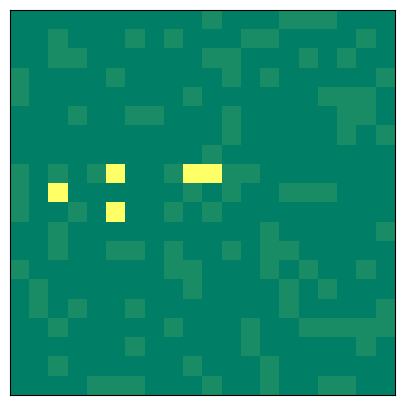

In [8]:
fig, axs = plt.subplots(figsize=(5, 5))
axs.set_xticks([])
axs.set_yticks([])
patch = plt.imshow(all_grids.iloc[0,0], cmap=plt.cm.summer)

grids_data = [all_grids.iloc[i, 0] for i in range(len(all_grids))]

def animate(i):
    patch.set_data(grids_data[i])
    return patch,


anim = animation.FuncAnimation(fig, animate, frames=range(len(all_grids)), repeat=False, blit=True)

In [9]:
anim

## Análisis

In [10]:
# Parámetros de la simulación
MAX_STEPS = 10000
ITERATIONS = 5

In [11]:
params = {
    "width": 20,
    "height": 20,
    "n_agents": 5,
    "n_packages": 100,
    "stack_height": 5,
    "max_energy": 100
}

results = batch_run(
    YardModel,
    parameters = params,
    iterations = ITERATIONS,
    max_steps = MAX_STEPS,
    number_processes = 1,
    data_collection_period = 1,
    display_progress = True
)

  0%|          | 0/5 [00:00<?, ?it/s]

In [12]:
df = pd.DataFrame(results)
data = df[(df.Step == MAX_STEPS)].drop(
    ['Step', 'width', 'height', 'n_agents', 'n_packages', 'stack_height', 'max_energy', 'Grid'], 
    axis = 1)

In [13]:
data.head()

,RunId,iteration,AgentID,Efficiency,Stacks
50000,0,0,0,413.50,4
50001,0,0,1,1577.00,4
50002,0,0,2,205.75,4
50003,0,0,3,99.25,4
50004,0,0,4,693.00,4


In [14]:
data.groupby(['AgentID']).agg(['min', 'mean', 'max'])[['Efficiency', 'Stacks']]

Efficiency                          Stacks         
               min        mean          max    min mean max
AgentID                                                    
0            61.25  357.550000  1075.750000      4  4.0   4
1           142.75  502.750000  1577.000000      4  4.0   4
2            85.00  191.266667   293.333333      3  3.8   4
3            56.75  126.666667   210.000000      3  3.8   4
4           125.75  711.600000  1405.000000      4  4.0   4

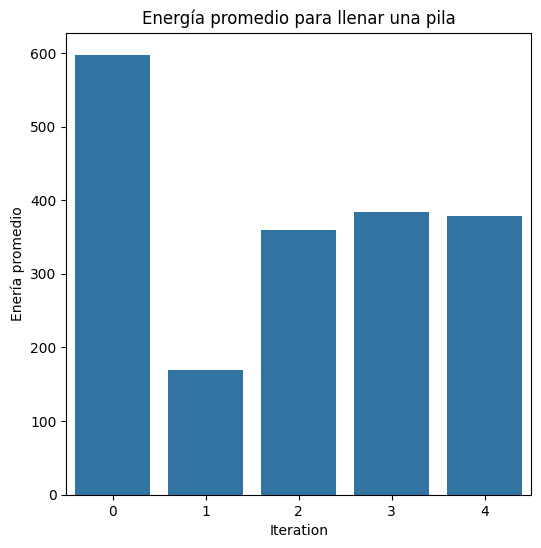

In [15]:
grouped = data.groupby('iteration')['Efficiency'].mean().reset_index()

plt.figure(figsize=(6, 6))
sns.barplot(x="iteration", y="Efficiency", data=grouped)
plt.title("Energía promedio para llenar una pila")
plt.xlabel("Iteration")
plt.ylabel("Enería promedio")
plt.show()

## Reflexión

Esta solución, como podemos observar en las gráficas, es altamente ineficiente. En promedio, un agente tarda entre 400 y 600 pasos para lograr llenar una pila, e incluso, hay iteraciones dónde un agente ha llegado a tardar más de 1500 pasos en llenar una pila, lo cual claramente no es óptimo.

Para mejorarlo, implementaré un sistema colaborativo dónde los agentes sepan dónde estan las pilas más cercanas y así, reducir bastante los pasos necesarios para completar la simulación.